In [ ]:
from pathlib import Path

from pymol import cmd


class Visualizer:
    def __init__(self, ref: Path, rotation: tuple[int, int, int], out_path: Path, zoom_buffer: float):
        self.out_path = out_path
        self.zoom_buffer = zoom_buffer
        cmd.delete('all')
        cmd.reinitialize()
        cmd.load(ref, "REF")
        cmd.remove("not polymer")
        cmd.remove("chain B")
        cmd.rotate("x", rotation[0])
        cmd.rotate("y", rotation[1])
        cmd.rotate("z", rotation[2])
        cmd.zoom("all", buffer=zoom_buffer)
        # cmd.png(str(self.out_path / f"ref.png"), width=500, height=500, dpi=200)
        cmd.hide("cartoon", "REF")

    def visualize(self, pdb: Path):
        name = f"{'-'.join(pdb.stem.split('_'))}"
        out = self.out_path / f"{name}.png"
        if out.exists():
            return
        cmd.load(pdb, name)
        cmd.align(name, "REF")
        cmd.zoom("all", buffer=self.zoom_buffer)
        cmd.color('white', name)
        cmd.png(str(out), width=500, height=500, dpi=200)
        cmd.delete(name)

    @staticmethod
    def visualize_all(protein_cls: str, ref: Path, rotation: tuple[int, int, int], zoom_buffer: float):
        samples_path = Path(f"../../data/{protein_cls}/generated/BQS")
        assert samples_path.exists()
        viz_out_path = samples_path.parent / "viz"
        viz_out_path.mkdir(exist_ok=True, parents=True)
        viz = Visualizer(ref, rotation, viz_out_path, zoom_buffer)
        for pdb in samples_path.glob("*.pdb"):
            viz.visualize(pdb)
        return viz.out_path

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


def plot(pngs: Path, nrows: int, ncols: int, figsize: tuple[float, float]):
    pngs = sorted(pngs.glob("*.png"), key=lambda x: (x.stem.split('-')[0], int(x.stem.split('-')[1])))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, dpi=300)
    for i, ax in enumerate(axes.flat):
        if i < len(pngs):
            png = pngs[i]
            img = mpimg.imread(png)
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])
            for o in ["top", "right", "bottom", "left"]:
                ax.spines[o].set_color('black')
                ax.spines[o].set_linewidth(0.5)
            ax.text(0.03, 0.95, png.stem, transform=ax.transAxes, ha='left', va='top', fontsize=7)
        else:
            ax.axis('off')

    plt.subplots_adjust(wspace=0.02)
    plt.show()

 Ray: render time: 0.66 sec. = 5447.2 frames/hour (17.05 sec. accum.).
 Ray: render time: 0.70 sec. = 5166.4 frames/hour (17.74 sec. accum.).
 Ray: render time: 0.82 sec. = 4388.3 frames/hour (18.56 sec. accum.).
 Ray: render time: 0.96 sec. = 3734.2 frames/hour (19.53 sec. accum.).
 Ray: render time: 0.85 sec. = 4252.7 frames/hour (20.37 sec. accum.).
 Ray: render time: 0.74 sec. = 4850.2 frames/hour (21.12 sec. accum.).
 Ray: render time: 0.57 sec. = 6360.1 frames/hour (21.68 sec. accum.).
 Ray: render time: 0.71 sec. = 5065.0 frames/hour (22.39 sec. accum.).
 Ray: render time: 0.83 sec. = 4346.5 frames/hour (23.22 sec. accum.).
 Ray: render time: 0.74 sec. = 4894.2 frames/hour (23.96 sec. accum.).
 Ray: render time: 0.84 sec. = 4295.4 frames/hour (24.79 sec. accum.).
 Ray: render time: 0.71 sec. = 5071.4 frames/hour (25.50 sec. accum.).
 Ray: render time: 0.86 sec. = 4168.3 frames/hour (26.37 sec. accum.).
 Ray: render time: 1.00 sec. = 3602.7 frames/hour (27.37 sec. accum.).
 Ray: 

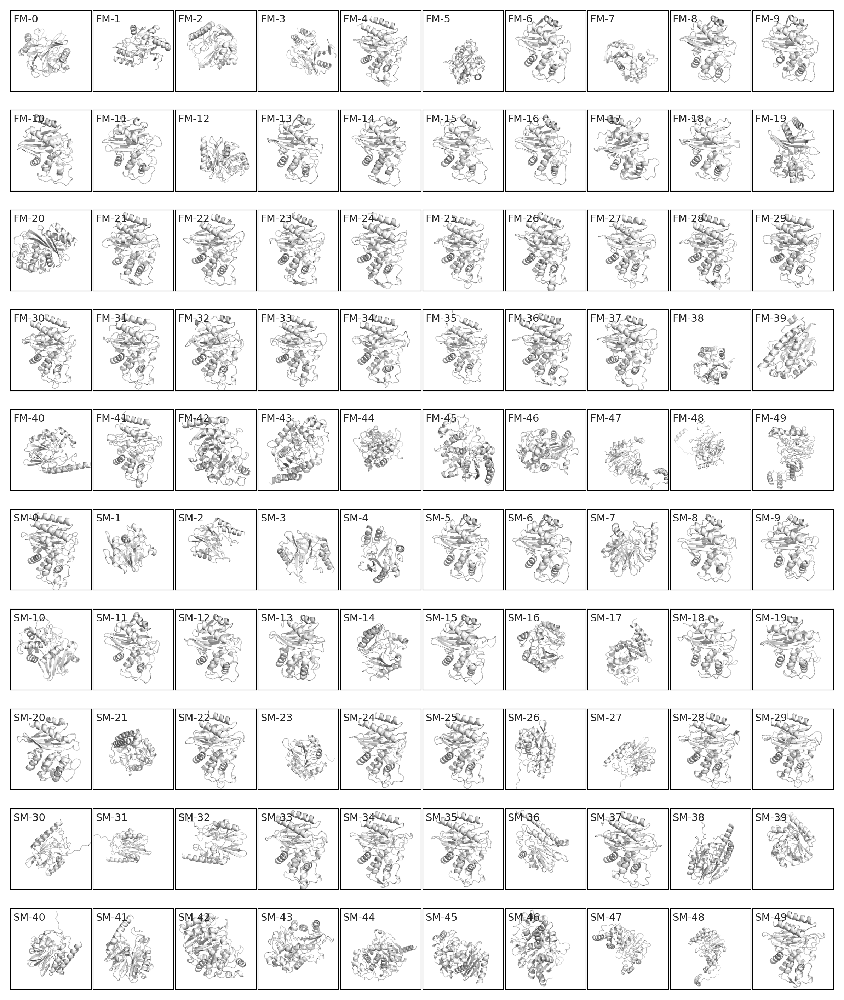

In [3]:
bldb_pngs: Path = Visualizer.visualize_all(
    "BLDB",
    Path("../docking/wd/BLDB/1GHP/1GHP.pdb"),
    rotation=(80, -15, 90),
    zoom_buffer=0
)
plot(bldb_pngs, nrows=10, ncols=10, figsize=(10, 12))

 Ray: render time: 0.66 sec. = 5450.6 frames/hour (251.78 sec. accum.).
 Ray: render time: 0.46 sec. = 7834.9 frames/hour (252.24 sec. accum.).
 Ray: render time: 0.50 sec. = 7253.8 frames/hour (252.73 sec. accum.).
 Ray: render time: 0.50 sec. = 7219.0 frames/hour (253.23 sec. accum.).
 Ray: render time: 0.50 sec. = 7229.1 frames/hour (253.73 sec. accum.).
 Ray: render time: 0.53 sec. = 6793.1 frames/hour (254.26 sec. accum.).
 Ray: render time: 0.42 sec. = 8543.7 frames/hour (254.68 sec. accum.).
 Ray: render time: 0.48 sec. = 7496.5 frames/hour (255.16 sec. accum.).
 Ray: render time: 0.51 sec. = 7077.8 frames/hour (255.67 sec. accum.).
 Ray: render time: 0.60 sec. = 5994.1 frames/hour (256.27 sec. accum.).
 Ray: render time: 0.39 sec. = 9296.1 frames/hour (256.66 sec. accum.).
 Ray: render time: 0.52 sec. = 6971.1 frames/hour (257.17 sec. accum.).
 Ray: render time: 0.50 sec. = 7185.1 frames/hour (257.68 sec. accum.).
 Ray: render time: 0.53 sec. = 6835.5 frames/hour (258.20 sec. a

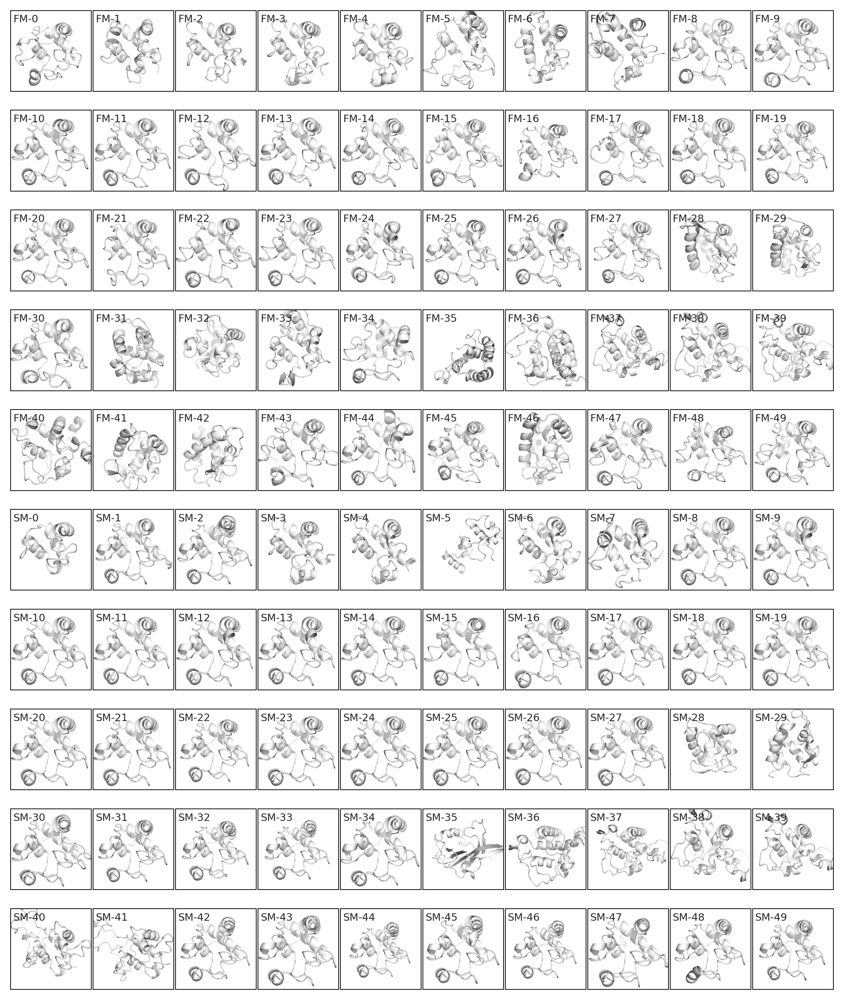

In [7]:
cytc_pngs: Path = Visualizer.visualize_all(
    "CYTC",
    Path("../docking/wd/CYTC/1HRC-HEC/1HRC.pdb"),
    rotation=(75, 10, 0),
    zoom_buffer=-3
)
plot(cytc_pngs, nrows=10, ncols=10, figsize=(10, 12))

 Ray: render time: 0.54 sec. = 6676.3 frames/hour (130.51 sec. accum.).
 Ray: render time: 0.54 sec. = 6629.8 frames/hour (131.05 sec. accum.).
 Ray: render time: 0.61 sec. = 5875.7 frames/hour (131.67 sec. accum.).
 Ray: render time: 0.66 sec. = 5472.7 frames/hour (132.32 sec. accum.).
 Ray: render time: 0.75 sec. = 4810.3 frames/hour (133.07 sec. accum.).
 Ray: render time: 0.50 sec. = 7139.9 frames/hour (133.58 sec. accum.).
 Ray: render time: 0.64 sec. = 5608.8 frames/hour (134.22 sec. accum.).
 Ray: render time: 0.64 sec. = 5657.7 frames/hour (134.85 sec. accum.).
 Ray: render time: 0.53 sec. = 6740.1 frames/hour (135.39 sec. accum.).
 Ray: render time: 0.47 sec. = 7617.4 frames/hour (135.86 sec. accum.).
 Ray: render time: 0.52 sec. = 6871.5 frames/hour (136.38 sec. accum.).
 Ray: render time: 0.54 sec. = 6721.2 frames/hour (136.92 sec. accum.).
 Ray: render time: 0.66 sec. = 5468.6 frames/hour (137.58 sec. accum.).
 Ray: render time: 0.64 sec. = 5632.9 frames/hour (138.22 sec. a

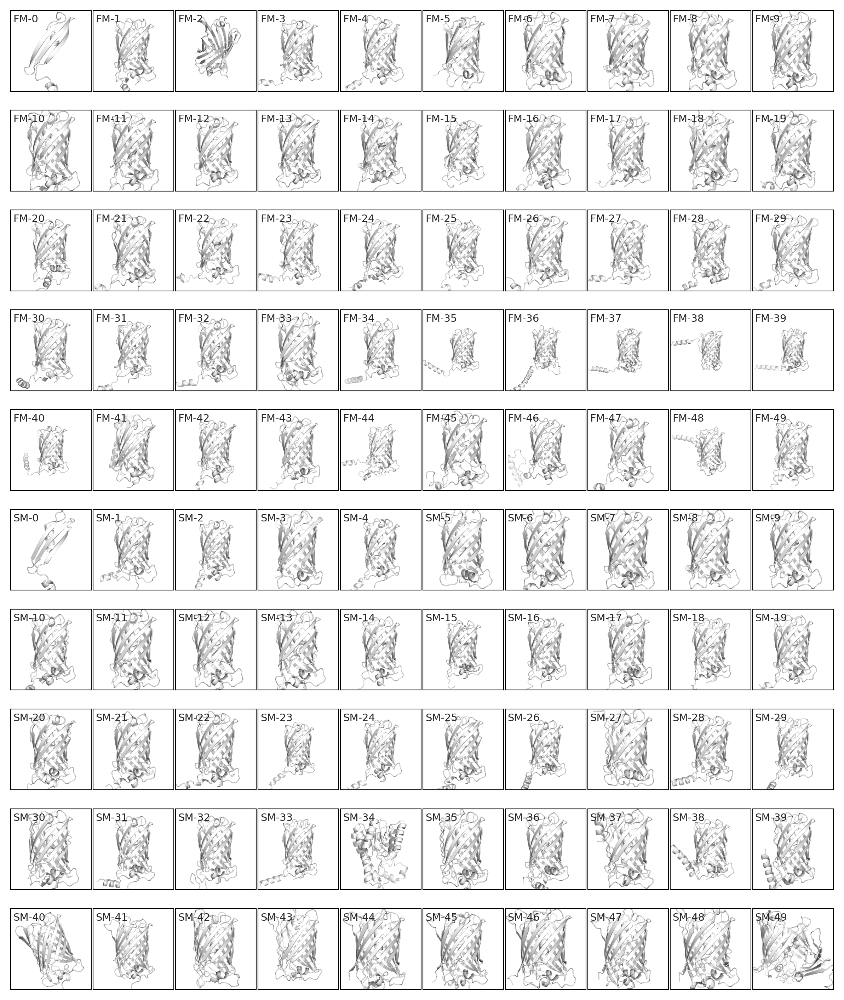

In [5]:
cytc_pngs: Path = Visualizer.visualize_all(
    "GFP",
    Path("../conservation/wd/GFP/4KW4.pdb"),
    rotation=(45, 45, 45),
    zoom_buffer=-2.5
)
plot(cytc_pngs, nrows=10, ncols=10, figsize=(10, 12))

 Ray: render time: 0.60 sec. = 5962.1 frames/hour (193.72 sec. accum.).
 Ray: render time: 0.68 sec. = 5328.9 frames/hour (194.39 sec. accum.).
 Ray: render time: 0.60 sec. = 6004.2 frames/hour (194.99 sec. accum.).
 Ray: render time: 0.62 sec. = 5760.1 frames/hour (195.62 sec. accum.).
 Ray: render time: 0.58 sec. = 6249.4 frames/hour (196.20 sec. accum.).
 Ray: render time: 0.58 sec. = 6250.0 frames/hour (196.77 sec. accum.).
 Ray: render time: 0.67 sec. = 5390.3 frames/hour (197.44 sec. accum.).
 Ray: render time: 0.61 sec. = 5910.5 frames/hour (198.05 sec. accum.).
 Ray: render time: 0.60 sec. = 6042.8 frames/hour (198.64 sec. accum.).
 Ray: render time: 0.54 sec. = 6606.2 frames/hour (199.19 sec. accum.).
 Ray: render time: 0.60 sec. = 6039.0 frames/hour (199.79 sec. accum.).
 Ray: render time: 0.46 sec. = 7801.4 frames/hour (200.25 sec. accum.).
 Ray: render time: 0.57 sec. = 6273.0 frames/hour (200.82 sec. accum.).
 Ray: render time: 0.60 sec. = 5999.2 frames/hour (201.42 sec. a

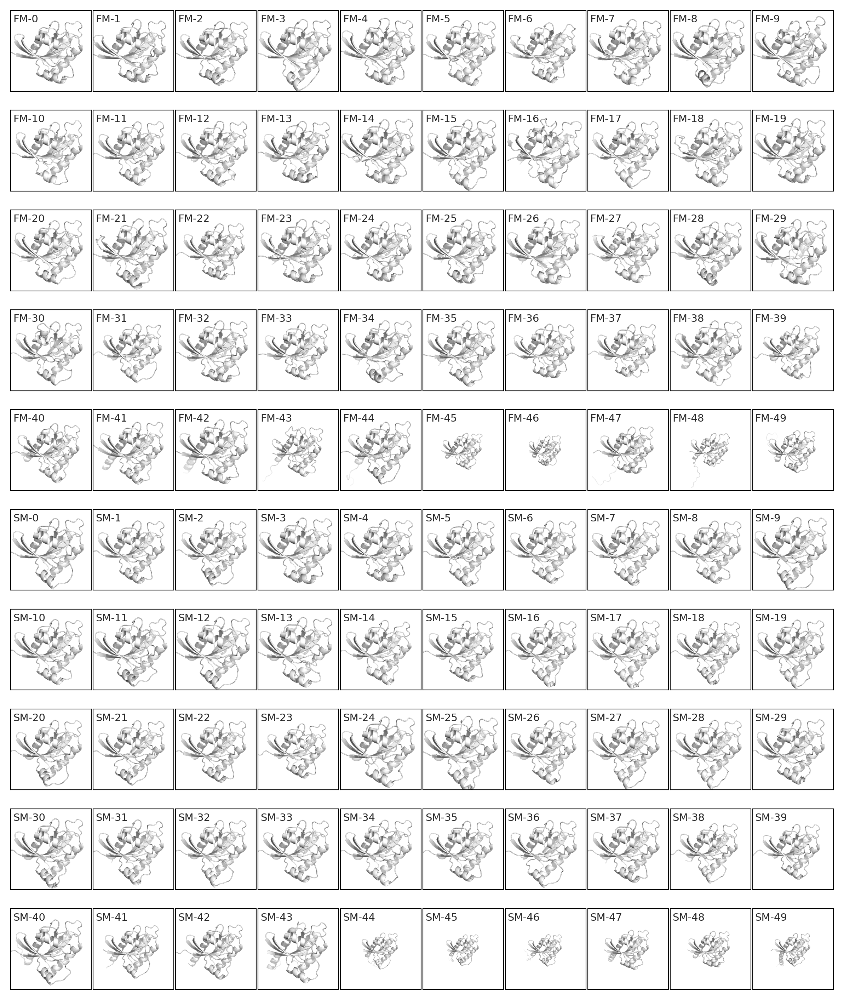

In [6]:
ras_pngs: Path = Visualizer.visualize_all(
    "RAS",
    Path("../docking/wd/RAS/4OBE-GDP/4OBE.pdb"),
    rotation=(75, 10, 0),
    zoom_buffer=-2.5
)
plot(ras_pngs, nrows=10, ncols=10, figsize=(10, 12))